# ML Endo segmentation for small molecule set
## For Vanesa Silvestri
## 09/27/21

### Random Forest classifier
### Author: Andy D. Tran, CCR Microscopy Core, LCBG, CCR, NCI

In [11]:
#Load libraries

import os
import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import pickle
import re

from scipy import ndimage as nd
from tifffile import imread, imsave
from skimage.filters import roberts, sobel, scharr, prewitt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from datetime import datetime
from skimage import measure
from skimage import morphology

In [12]:
#Define feature extraction function

def feature_extract(img):
    df = pd.DataFrame() #Create empty dataframe
    
    print('Add orginal pixel values') # Reshape pixel values, add to dataframe
    org = img.reshape(-1) 
    df['org_image'] = org
    
    print('Add Gabor features')  # Generate Gabor features
    num = 1              
    kernels = []
    
    for theta in range(2):
        theta = theta / 4 * np.pi
        for sigma in (1, 3):
            for lamda in np.arange(0, np.pi, np.pi / 4):
                for gamma in (0.05, 0.5):
            
                    gabor_label = 'Gabor' + str(num)
                    ksize = 3
                    kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)
                    kernels.append(kernel)
            
                    fimg = cv2.filter2D(img, cv2.CV_16UC3, kernel)
                    filtered_img = fimg.reshape(-1)
            
                    df[gabor_label] = filtered_img
                    num += 1
                    
    print('Add Median filter') #Add Median filter
    for sigma in range(2, 6):
        print('Sigma = ' + str(sigma))
        
        median_tmp = nd.median_filter(img, size=sigma)
        median_img = median_tmp.reshape(-1)
        median_header = 'Median_sigma_' + str(sigma)
        
        df[median_header] = median_img
        
    print('Add Sobel edge detection')  # Add Sobel edge detection
    edge_sobel_tmp = sobel(img)
    edge_sobel_tmp = nd.gaussian_filter(edge_sobel_tmp, sigma = 3)
    edge_sobel = edge_sobel_tmp.reshape(-1)
    
    df['sobel'] = edge_sobel
    
    return df
    
    print('Feature extraction done!')

In [13]:
# Define object feature extraction

def object_extract(img, original):
    print('Starting object feature extraction')
    
    df = pd.DataFrame() #Create empty dataframe
    cell_id_tmp = []
    mean_tmp = []
    area_tmp = []
    axis_major_tmp = []
    axis_minor_tmp = []
    eccentricity_tmp = []
    feret_diameter_tmp = []
    perimeter_tmp = []
    #circularity_tmp = []
    solidity_tmp = []
    
    props = measure.regionprops(img, intensity_image = original)
    
    for roi in range(len(props)):
        
        cell_id_tmp.append(props[roi].label)
        mean_tmp.append(props[roi].mean_intensity)
        area_tmp.append(props[roi].area)
        axis_major_tmp.append(props[roi].major_axis_length)
        axis_minor_tmp.append(props[roi].minor_axis_length)
        eccentricity_tmp.append(props[roi].eccentricity)
        feret_diameter_tmp.append(props[roi].feret_diameter_max)
        perimeter_tmp.append(props[roi].perimeter)
        #circularity_tmp.append((4 * np.pi * area_tmp[roi] / (perimeter_tmp[roi] * perimeter_tmp[roi])))
        solidity_tmp.append(props[roi].solidity)
        
    df['cell_ID'] = cell_id_tmp
    df['mean_int'] = mean_tmp
    df['area'] = area_tmp
    df['axis_major'] = axis_major_tmp
    df['axis_minor'] = axis_minor_tmp
    df['eccentricity'] = eccentricity_tmp
    df['feret_diameter'] = feret_diameter_tmp
    df['perimeter'] = perimeter_tmp
    #df['circularity'] = circularity_tmp
    df['solidity'] = solidity_tmp
    
    print('Feature extraction done!')
    
    return df

In [14]:
# Define image loading, model application, and output function

def model_apply(img):
    print('Opening ' + img)
    print('Image feature extraction started: ' + str(datetime.now()))
    input_path = os.path.join(base_path, img)
    endo_path = os.path.join(input_path, 'endo.tif')
    endo = imread(endo_path)
    #blur = nd.gaussian_filter(endo, sigma=50)
    #endo_correct = np.subtract(endo, blur)
    df = feature_extract(endo)
    print('Image feature extraction finished: ' + str(datetime.now()))
    
    print('ML model started: ' + str(datetime.now()))
    endo_tmp = model.predict(df)
    endo_mask = endo_tmp.reshape(endo.shape)
    print('ML model finished: ' + str(datetime.now()))
    
    plt.figure(figsize = (10, 10))
    plt.imshow(endo_mask, cmap = 'gray')
    plt.axis('off')
    
    print('Pixel classification done: ' + str(datetime.now()))
    
    return endo_mask


In [15]:
# Define object classification function

def object_apply(img):
    print('Opening ' + img)
    print('Object feature extraction started: ' + str(datetime.now()))
    input_path = os.path.join(base_path, img)
    endo_path = os.path.join(input_path, 'endo.tif')
    endo = imread(endo_path)
    
    endo_mask2 = morphology.area_opening(endo_mask, area_threshold = 5)
    endo_label = measure.label(endo_mask2)
    
    df = object_extract(endo_label, endo)
    print('Object feature extraction finished: ' + str(datetime.now()))
    
    cell_id_array = df['cell_ID'].to_numpy()
    print(cell_id_array)
    print(cell_id_array.shape)
    df = df.drop(labels = ['cell_ID'], axis = 1)
    
    print('ML object model started: ' + str(datetime.now()))
    object_tmp = object_model.predict(df)
    cell_id_array = np.append(cell_id_array, 0)
    object_tmp = np.append(object_tmp, 0)
    object_df = pd.DataFrame()
    object_df['cell_ID'] = cell_id_array
    object_df['object_class'] = object_tmp
    #object_df = pd.DataFrame(object_tmp, columns = ['object_class'])
    #object_df = pd.concat([object_df, cell_id_df], axis = 1)
    
    print(object_df.head())
    
    print('object_df: ' + str(object_df.shape))
    
    endo_object = endo_label.reshape(-1)
    print('endo_object: ' + str(endo_object.shape))
    #endo_range = np.arange(len(endo_object))
    endo_df = pd.DataFrame()
    endo_df['cell_ID'] = endo_object
    #endo_df['endo_range'] = endo_range
    
    test = endo_df['cell_ID'].to_numpy()
    test = test.reshape(endo.shape)
    
    plt.figure(figsize = (10, 10))
    plt.imshow(test, cmap = 'nipy_spectral')
    plt.axis('off')    
    
    endo_df = pd.merge(endo_df, object_df, how = 'left', on = ['cell_ID'])
    #endo_df.sort_values(by = ['endo_range'])
    print('endo_object: ' + str(endo_object.shape))
    print(endo_df.head())
    print('endo_df: ' + str(endo_df.shape))
    
    test = endo_df['cell_ID'].to_numpy()
    test = test.reshape(endo.shape)
    
    plt.figure(figsize = (10, 10))
    plt.imshow(test, cmap = 'nipy_spectral')
    plt.axis('off')    
    
    #endo_df.loc[endo_df['object_class'] == 1, 'object_mask'] = int(1)
    #endo_df.loc[endo_df['object_class'] == 2, 'object_mask'] = int(0)
    
    endo_df2 = endo_df
    endo_df2['object_mask'] = np.where(endo_df2['object_class'] == 1, 1, 0)
    
    print('endo_df2: ' + str(endo_df2.shape))
    
    print(endo_df2.head())
    
    #endo_mask3 = endo_df2['object_mask'].to_numpy()
    endo_mask3 = endo_df2['object_mask'].to_numpy()
    
    #endo_df2 = endo_df.drop(labels = ['cell_ID', 'object_class'], axis = 1)
    #print(endo_df2.shape)
    
    #endo_mask3 = endo_df2.to_numpy()
    print('endo_object: ' + str(endo_object.shape))
    print('endo_mask3: ' + str(endo_mask3.shape))
    endo_mask3 = endo_mask3.reshape(endo.shape)
    endo_label2 = measure.label(endo_mask3)
    endo_label2 = np.uint16(endo_label2)
    print('endo_label2: ' + str(endo_label2.dtype))
    
    plt.figure(figsize = (10, 10))
    plt.imshow(endo_label2, cmap = 'nipy_spectral')
    plt.axis('off')
    
    #mask_name = img.replace('.tif', '_label.tif') 
    mask_name = 'endo_label.tif'
    output_path2 = os.path.join(output_path, img)
    mask_path = os.path.join(output_path2, mask_name)
    imsave(mask_path, endo_label2)
    
    print('Object classification done: ' + str(datetime.now()))
    

In [16]:
# Define paths

base_path = '/data/tranad/image/silvestv/images/biocytin_set_03'
model_path = '/data/tranad/image/silvestv/ML_small_molecule/endo_model_hpc_01'
object_path = '/data/tranad/image/silvestv/ML_small_molecule/endo_object_model_hpc_02'
output_path = '/data/tranad/image/silvestv/images/biocytin_set_03'

In [17]:
# Load pickle model

model = pickle.load(open(model_path, 'rb'))
object_model = pickle.load(open(object_path, 'rb'))

In [18]:
#img_list = os.listdir(base_path)
#print(img_list)
#print(len(img_list))

In [19]:
img_list = ['IgG_2h_555', 'TZ_60min_555', 'TZ_60min_555_2', 'TZ_2h_557', 'IgG_6h_574', 'IgG_60min_571', 'IgG_60min_571_2', 'IgG_6h_554', 'TZ_4h_5', ]

print(img_list)

['IgG_2h_555', 'TZ_60min_555', 'TZ_60min_555_2', 'TZ_2h_557', 'IgG_6h_574', 'IgG_60min_571', 'IgG_60min_571_2', 'IgG_6h_554', 'TZ_4h_5']


Opening IgG_2h_555
Image feature extraction started: 2022-05-19 12:45:30.845070
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 12:47:36.754041
ML model started: 2022-05-19 12:47:36.754170


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 12:51:25.584608
Pixel classification done: 2022-05-19 12:51:26.070064
Opening IgG_2h_555
Object feature extraction started: 2022-05-19 12:51:26.931946
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 12:54:00.618964
[    1     2     3 ... 22421 22422 22423]
(22423,)
ML object model started: 2022-05-19 12:54:00.626408
   cell_ID  object_class
0        1             1
1        2             2
2        3             1
3        4             1
4        5             2
object_df: (22424, 2)
endo_object: (85783581,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (85783581,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (85783581, 2)
endo_df2: (85783581, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (85783581,)
endo_mask3: (85783581,)
endo_label2: uint16
Object classification done: 2022-05-19 12:54:30.314804
Opening TZ_60min_555
Image feature extraction started: 2022-05-19 12:54:30.734447
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 12:57:12.125704
ML model started: 2022-05-19 12:57:12.125813


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:02:07.069516
Pixel classification done: 2022-05-19 13:02:07.707012
Opening TZ_60min_555
Object feature extraction started: 2022-05-19 13:02:08.861844
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:06:14.054410
[    1     2     3 ... 26870 26871 26872]
(26872,)
ML object model started: 2022-05-19 13:06:14.059657
   cell_ID  object_class
0        1             2
1        2             2
2        3             1
3        4             1
4        5             1
object_df: (26873, 2)
endo_object: (121869560,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (121869560,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (121869560, 2)
endo_df2: (121869560, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (121869560,)
endo_mask3: (121869560,)
endo_label2: uint16
Object classification done: 2022-05-19 13:06:56.618477
Opening TZ_60min_555_2
Image feature extraction started: 2022-05-19 13:06:57.250615
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:09:40.006507
ML model started: 2022-05-19 13:09:40.006691


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:15:09.168415
Pixel classification done: 2022-05-19 13:15:09.822133
Opening TZ_60min_555_2
Object feature extraction started: 2022-05-19 13:15:10.992451
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:19:23.142141
[    1     2     3 ... 26692 26693 26694]
(26694,)
ML object model started: 2022-05-19 13:19:23.148194
   cell_ID  object_class
0        1             1
1        2             1
2        3             1
3        4             1
4        5             1
object_df: (26695, 2)
endo_object: (121798870,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (121798870,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (121798870, 2)
endo_df2: (121798870, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (121798870,)
endo_mask3: (121798870,)
endo_label2: uint16
Object classification done: 2022-05-19 13:20:05.836917
Opening TZ_2h_557
Image feature extraction started: 2022-05-19 13:20:06.464069
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:22:24.809848
ML model started: 2022-05-19 13:22:24.810114


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:26:44.890671
Pixel classification done: 2022-05-19 13:26:45.402720
Opening TZ_2h_557
Object feature extraction started: 2022-05-19 13:26:46.350759
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:29:39.924290
[    1     2     3 ... 23055 23056 23057]
(23057,)
ML object model started: 2022-05-19 13:29:39.929144
   cell_ID  object_class
0        1             2
1        2             1
2        3             2
3        4             1
4        5             1
object_df: (23058, 2)
endo_object: (94712020,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (94712020,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (94712020, 2)
endo_df2: (94712020, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (94712020,)
endo_mask3: (94712020,)
endo_label2: uint16
Object classification done: 2022-05-19 13:30:13.547057
Opening IgG_6h_574
Image feature extraction started: 2022-05-19 13:30:14.049754
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:32:20.784702
ML model started: 2022-05-19 13:32:20.784852


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:36:14.290191
Pixel classification done: 2022-05-19 13:36:14.745106
Opening IgG_6h_574
Object feature extraction started: 2022-05-19 13:36:15.579062
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:38:46.850494
[    1     2     3 ... 19413 19414 19415]
(19415,)
ML object model started: 2022-05-19 13:38:46.854841
   cell_ID  object_class
0        1             1
1        2             1
2        3             1
3        4             1
4        5             1
object_df: (19416, 2)
endo_object: (83255358,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (83255358,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (83255358, 2)
endo_df2: (83255358, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (83255358,)
endo_mask3: (83255358,)
endo_label2: uint16
Object classification done: 2022-05-19 13:39:16.460232
Opening IgG_60min_571
Image feature extraction started: 2022-05-19 13:39:16.898473
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:41:08.602387
ML model started: 2022-05-19 13:41:08.602715


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:44:38.662778


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Pixel classification done: 2022-05-19 13:44:39.091778
Opening IgG_60min_571
Object feature extraction started: 2022-05-19 13:44:39.829501
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:47:11.777463
[    1     2     3 ... 21911 21912 21913]
(21913,)
ML object model started: 2022-05-19 13:47:11.782358
   cell_ID  object_class
0        1             1
1        2             2
2        3             1
3        4             2
4        5             2
object_df: (21914, 2)
endo_object: (77776728,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (77776728,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (77776728, 2)
endo_df2: (77776728, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (77776728,)
endo_mask3: (77776728,)
endo_label2: uint16
Object classification done: 2022-05-19 13:47:39.667629
Opening IgG_60min_571_2
Image feature extraction started: 2022-05-19 13:47:40.076807
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:49:22.917343
ML model started: 2022-05-19 13:49:22.917462


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 13:52:31.988635
Pixel classification done: 2022-05-19 13:52:32.377041
Opening IgG_60min_571_2
Object feature extraction started: 2022-05-19 13:52:33.028058
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 13:54:45.706154
[    1     2     3 ... 18432 18433 18434]
(18434,)
ML object model started: 2022-05-19 13:54:45.711165
   cell_ID  object_class
0        1             1
1        2             2
2        3             1
3        4             1
4        5             1
object_df: (18435, 2)
endo_object: (68689560,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (68689560,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (68689560, 2)
endo_df2: (68689560, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (68689560,)
endo_mask3: (68689560,)
endo_label2: uint16
Object classification done: 2022-05-19 13:55:10.542591
Opening IgG_6h_554
Image feature extraction started: 2022-05-19 13:55:10.920709
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 13:57:35.738270
ML model started: 2022-05-19 13:57:35.738394


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 14:02:16.745150
Pixel classification done: 2022-05-19 14:02:17.311453
Opening IgG_6h_554
Object feature extraction started: 2022-05-19 14:02:18.300042
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 14:05:39.398762
[    1     2     3 ... 22684 22685 22686]
(22686,)
ML object model started: 2022-05-19 14:05:39.404208
   cell_ID  object_class
0        1             2
1        2             1
2        3             1
3        4             2
4        5             1
object_df: (22687, 2)
endo_object: (105094304,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (105094304,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (105094304, 2)
endo_df2: (105094304, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (105094304,)
endo_mask3: (105094304,)
endo_label2: uint16
Object classification done: 2022-05-19 14:06:17.271142
Opening TZ_4h_5
Image feature extraction started: 2022-05-19 14:06:17.825904
Add orginal pixel values
Add Gabor features
Add Median filter
Sigma = 2
Sigma = 3
Sigma = 4
Sigma = 5
Add Sobel edge detection
Image feature extraction finished: 2022-05-19 14:08:19.877681
ML model started: 2022-05-19 14:08:19.878038


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


ML model finished: 2022-05-19 14:11:58.911282
Pixel classification done: 2022-05-19 14:11:59.314822
Opening TZ_4h_5
Object feature extraction started: 2022-05-19 14:12:00.044544
Starting object feature extraction
Feature extraction done!
Object feature extraction finished: 2022-05-19 14:14:15.133787
[    1     2     3 ... 17899 17900 17901]
(17901,)
ML object model started: 2022-05-19 14:14:15.137900
   cell_ID  object_class
0        1             2
1        2             2
2        3             1
3        4             1
4        5             1
object_df: (17902, 2)
endo_object: (76920129,)


/usr/local/Anaconda/envs/py3.7/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


endo_object: (76920129,)
   cell_ID  object_class
0        0             0
1        0             0
2        0             0
3        0             0
4        0             0
endo_df: (76920129, 2)
endo_df2: (76920129, 3)
   cell_ID  object_class  object_mask
0        0             0            0
1        0             0            0
2        0             0            0
3        0             0            0
4        0             0            0
endo_object: (76920129,)
endo_mask3: (76920129,)
endo_label2: uint16
Object classification done: 2022-05-19 14:14:42.468154


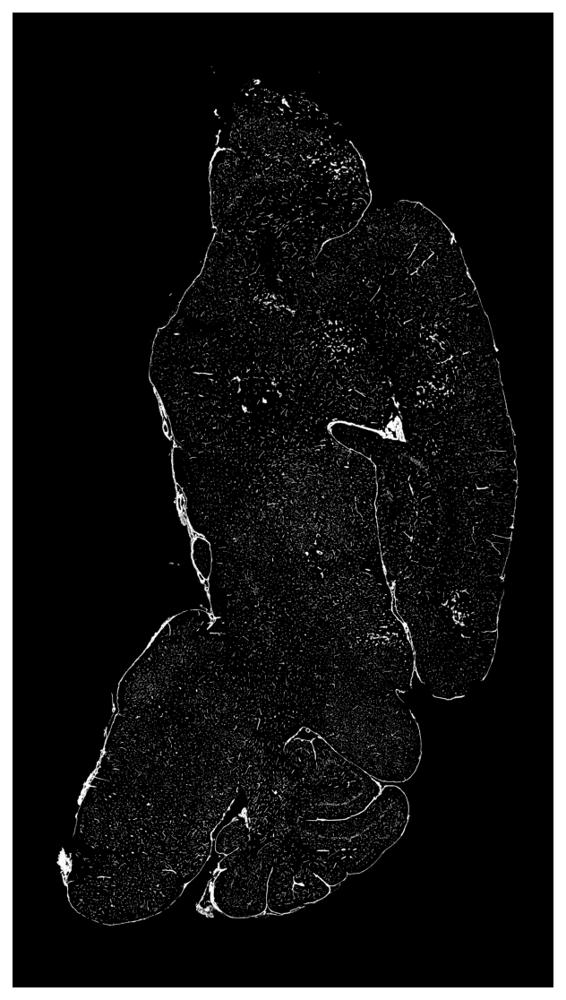

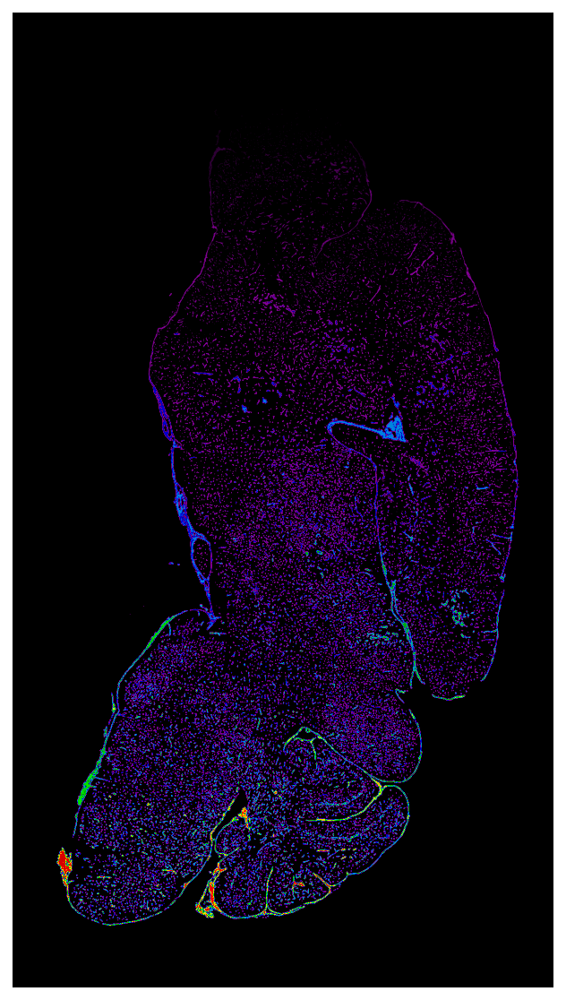

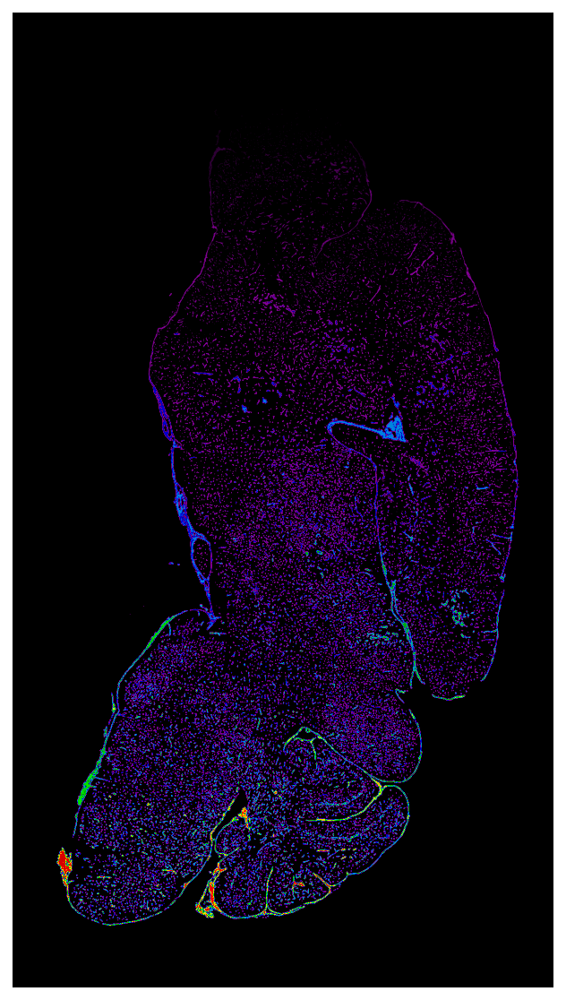

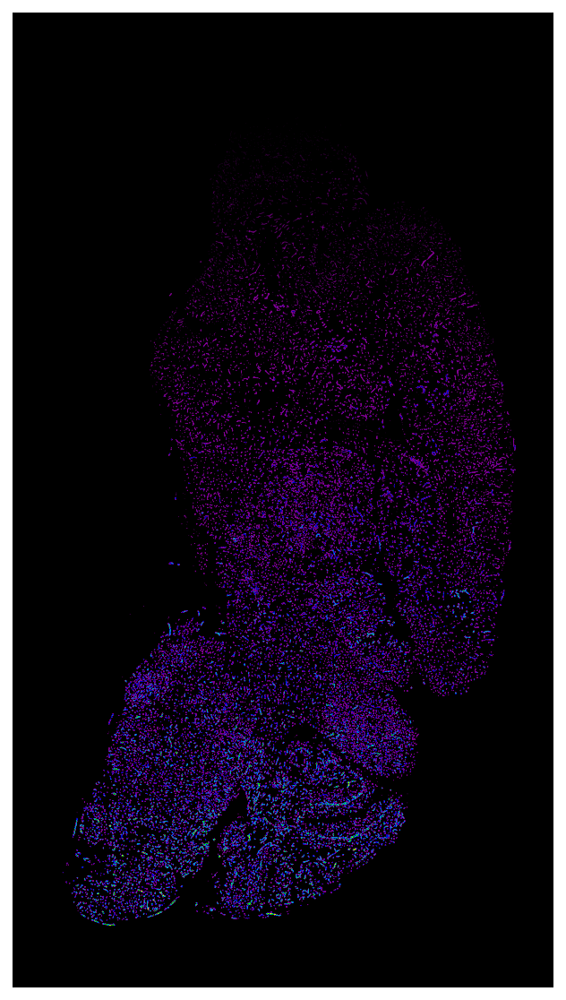

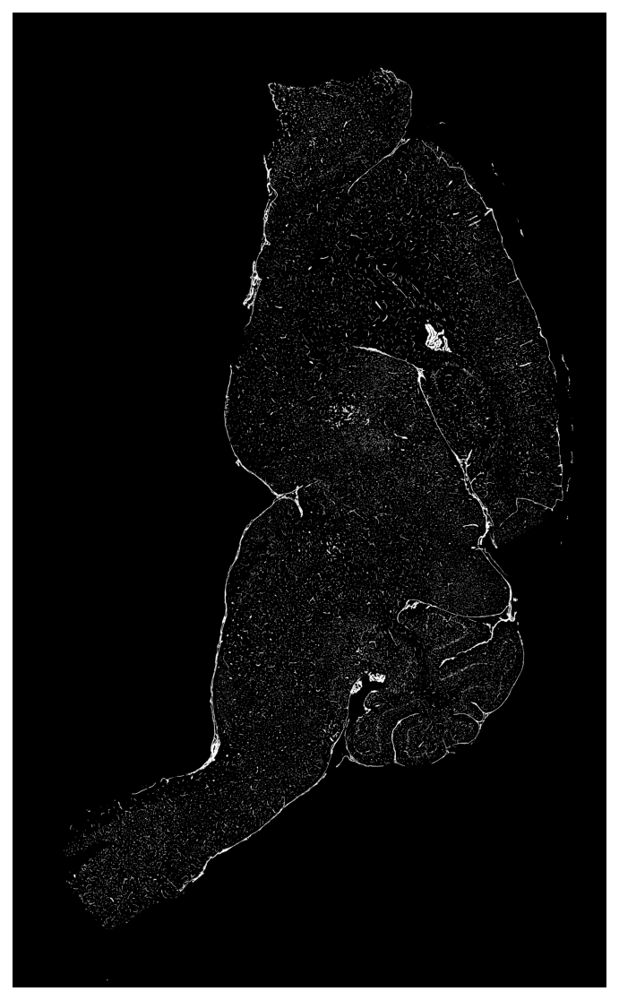

...

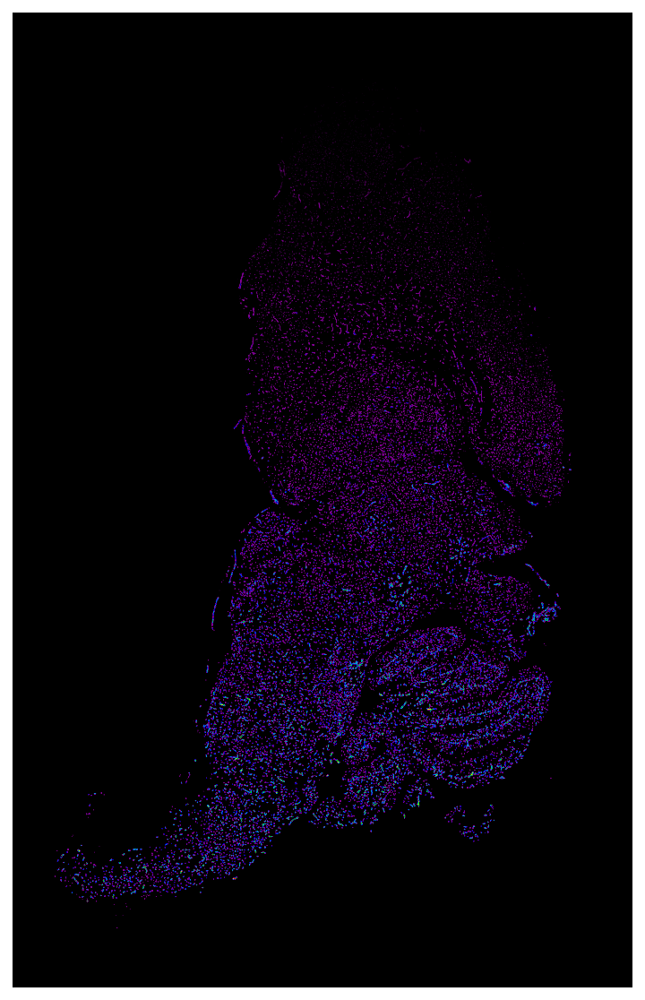

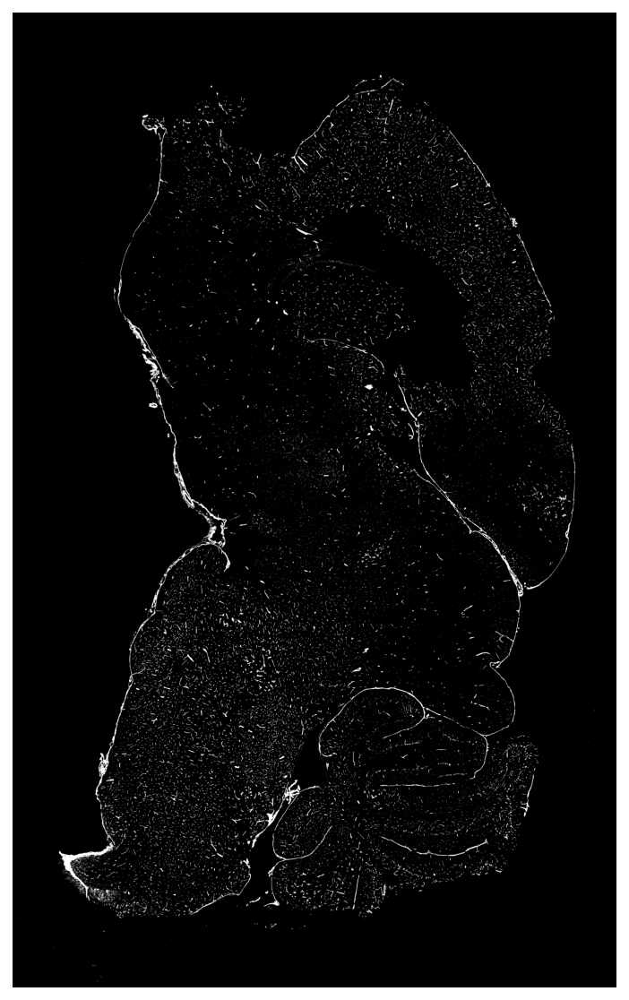

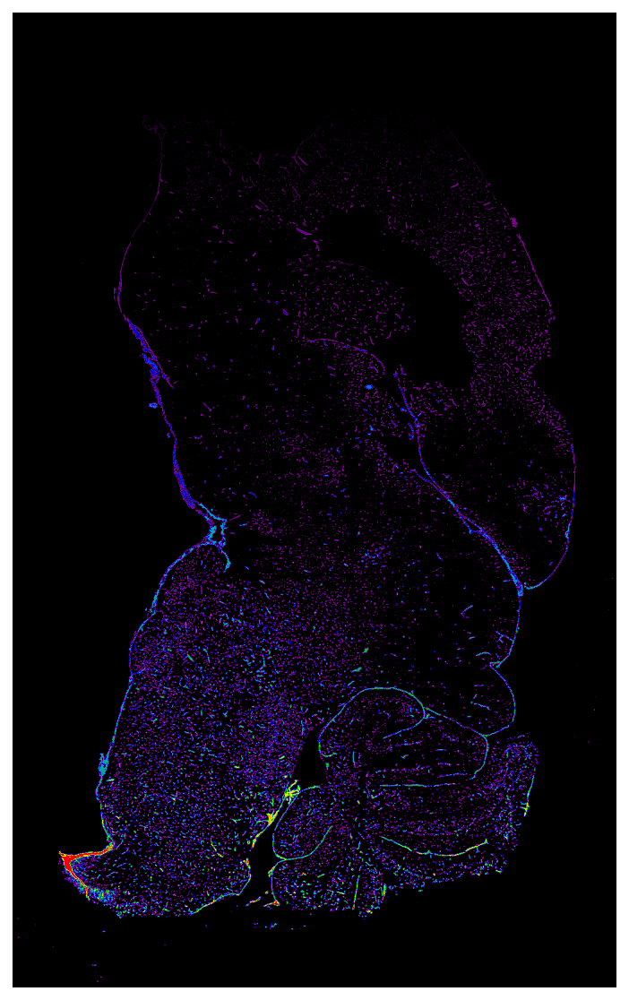

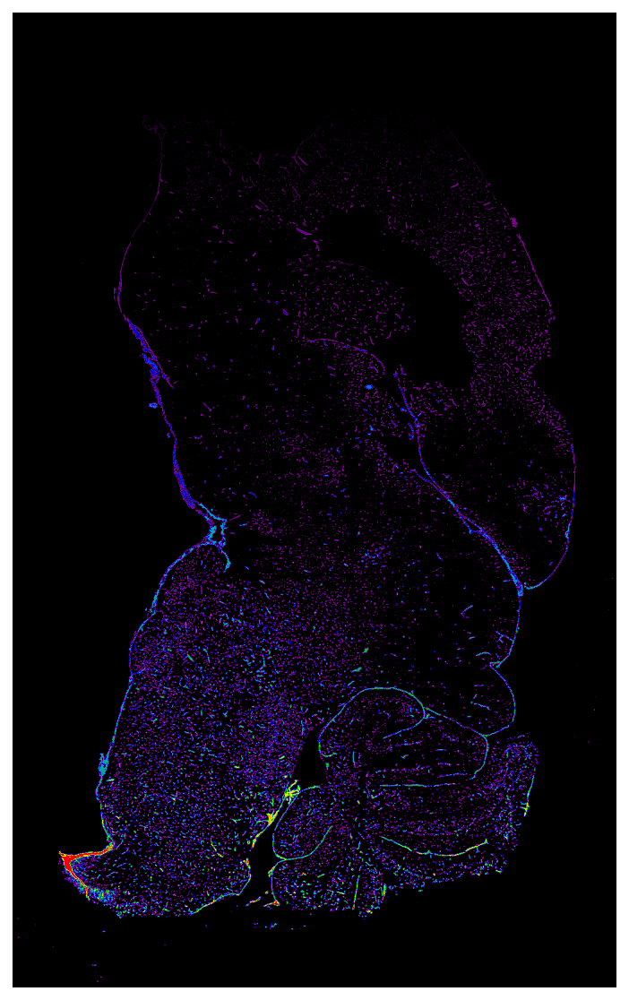

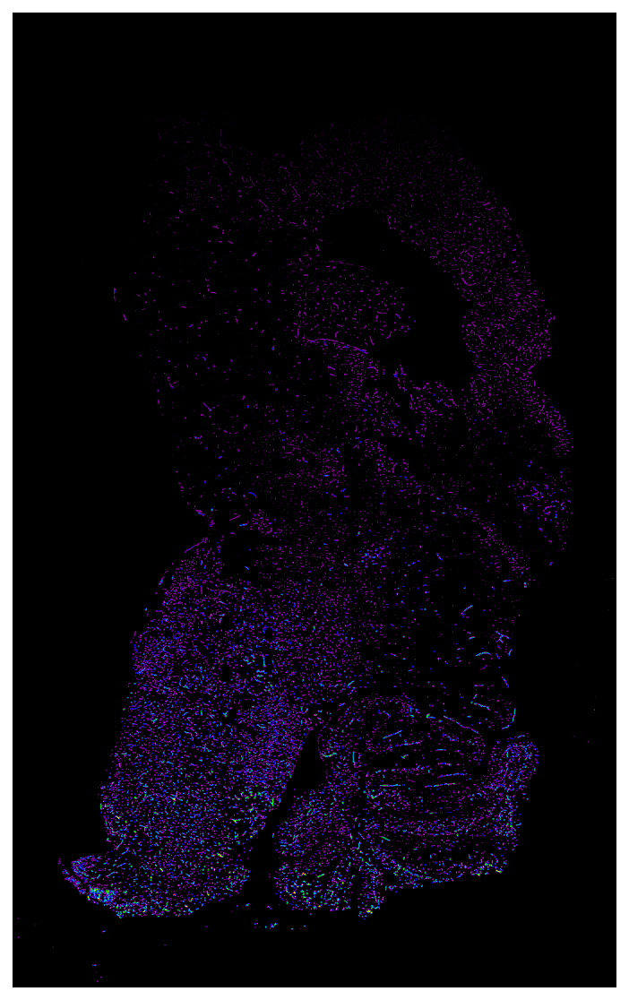

In [20]:
for img in img_list:
    endo_mask = model_apply(img)
    object_apply(img)

In [21]:
#endo_mask = model_apply('endo_correct_03.tif')

In [22]:
#print('endo_mask: ' + str(endo_mask.shape))


In [23]:
#object_apply('endo_correct_03.tif')